# COSC2671 Social Media and Network Analytics

## Workshop 4

Jeffrey Chan, RMIT University, 2023

In [65]:
# import the ReddditProcess class python script that are based on the RedditProcessing class python script,
#  but also add additional funcitons
from RedditProcess import RedditProcess

# importing packages and nltk data libraries
import string
import json
import codecs
import re

import nltk
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

from colorama import Fore, Back, Style
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/siriuslam/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


### Approach 1: Use counts of positive and negative words to calculate the sentiment.

This has 2 helper functions computerSentiment() and printColouredTokens().

Complete the parts with TODO for the workshop.

In [66]:
def computeSentiment(lTokens, setPosWords, setNegWords):
    """
    Compute the overall sentiment of the list of tokens in lTokens, using the countWordSentimentAnalysis approach.
    
    @param lTokens: List of tokens to calculate the overall sentiment for.
    @param setPosWords: Set of positive words.
    @param setNegWords: Set of negative words.
    
    @returns Sentiment score for lTokens.
    """
    
    #
    # TODO: compute the sentiment 
    #
            
    # TODO: count the number of positive words (hint: use setPosWords)
    posNum = len([tok for tok in lTokens if tok in setPosWords])
    # TODO: count the number of negative words (hint: use setNegWords)
    negNum = len([tok for tok in lTokens if tok in setNegWords])

    # TODO: compute the sentiment value
    # replace the right hand side with the computed value of sentiment 
    # the '0' value is currently a placeholder
    sentiment = posNum - negNum
    
    return sentiment


In [67]:
def printColouredTokens(lTokens, setPosWords, setNegWords, sentiment):
    """
    Print out the tokens in different colours, according to sentiment.
    If positive, in red.
    If negative, in blue.
    Otherwise no colouring.
    
    @param lTokens: List of tokens to print and colour.
    @param setPosWords: Set of positive words.
    @param setNegWords: Set of negative words.
    @param sentiment: Sentiment score of list of tokens.
    """
        
    for token in lTokens:
        if token in setPosWords:
            print(Fore.RED + token + ', ', end='')
        elif token in setNegWords:
            print(Fore.BLUE + token + ', ', end='')
        else:
            print(Style.RESET_ALL + token + ', ', end='')

    print(': {}'.format(sentiment))
    

In [68]:
def countWordSentimentAnalysis(setPosWords, setNegWords, sTweetsFilename, bPrint, redditProcessor):
    """
    Basic sentiment analysis.  Count the number of positive words, count the negative words, overall polarity is the
    difference in the two numbers.

    @param setPosWords: set of positive sentiment words
    @param setNegWords: set of negative sentiment words
    @param sFilename: name of input file containing a json formated dump
    @param bPrint: whether to print the stream of tokens and sentiment.  Uses colorama to highlight sentiment words.
    @param redditProcessor: RedditProcessing object, used to pre-process each tweet.

    @returns: list of reddit posts, in the format of [date, sentiment]
    """


    cSentiment = []
    # open file and process reddit submissions and comments, one by one
    with open(sTweetsFilename, 'r') as f:
        redditDump = json.load(f)
        
        # process reddit submissions
        for submission in redditDump['submissions']: 
            postText = submission['title']
            postContent = submission['content']
            postDate = submission['created']
            
            # pre-process the reddit post text
            lTokens = redditProcessor.process(postText)
            lTokens = redditProcessor.process(postContent)
            
            # compute sentiment (There are TODOs within function)
            sentiment = computeSentiment(lTokens, setPosWords, setNegWords)
                
            # save the date and sentiment of each reddit post (used for time series)
            cSentiment.append([pd.to_datetime(postDate, unit='s'), sentiment])

            # if we are printing, each token is printed and coloured according to red if positive word, and blue
            # if negative
            if bPrint:
                printColouredTokens(lTokens, setPosWords, setNegWords, sentiment)
                
            # process the comments
            for comment in submission['comments']:
                postText = comment['text']
                postDate = comment['created']
                
                # pre-process the tweet text
                lTokens = redditProcessor.process(postText)
            
                # compute sentiment (There are TODOs within function)
                sentiment = computeSentiment(lTokens, setPosWords, setNegWords)
                
                # save the date and sentiment of each tweet (used for time series)
                cSentiment.append([pd.to_datetime(postDate,unit='s'), sentiment])

                # if we are printing, each token is printed and coloured according to if the are positive or negative 
                # sentiment
                if bPrint:
                    printColouredTokens(lTokens, setPosWords, setNegWords, sentiment)


    return cSentiment


### Approach 2: Vader based approach to sentiment analysis.

In [69]:
def vaderPrintTokens(lTokens, dSentimentScores):
    """
    Print out the tokens and sentiment score.
    
    @param lTokens: List of tokens to print and colour.
    @dSentimentScores: Dictionary of sentiment from Vader.

    """
    print(*lTokens, sep=', ')
    for cat,score in dSentimentScores.items():
        print('{0}: {1}, '.format(cat, score), end='')
    print()

In [70]:
def vaderSentimentAnalysis(sTweetsFilename, bPrint, redditProcessor):
    """
    Use Vader lexicons instead of a raw positive and negative word count.

    @param sTweetsFilename: name of input file containing a json formated tweet dump
    @param bPrint: whether to print the stream of tokens and sentiment.  Uses colorama to highlight sentiment words.
    @param redditProcessor: TweetProcessing object, used to pre-process each tweet.

    @returns: list of tweets, in the format of [date, sentiment]
    """

    # this is the vader sentiment analyser, part of nltk
    sentAnalyser = SentimentIntensityAnalyzer()


    vSentiment = []
    # open file and process tweets, one by one
    with open(sTweetsFilename, 'r') as f:
        redditDump = json.load(f)

        # process reddit submissions - title and content
        for submission in redditDump['submissions']:
            postText = submission['title']
            postDate = submission['created']
            
            # pre-process the post text
            lTokens = redditProcessor.process(postText)

            # this computes the sentiment scores (called polarity score in nltk, but mean same thing essentially)
            # see workshop sheet for what dSentimentScores holds
            dSentimentScores = sentAnalyser.polarity_scores(postText)

            # save the date and sentiment of each post (used for time series)
            vSentiment.append([pd.to_datetime(postDate, unit='s'), dSentimentScores['neg'], dSentimentScores['neu'], dSentimentScores['pos'], dSentimentScores['compound']])

            # if we are printing, we print the tokens then the sentiment scores.  Because we don't have the list
            # of positive and negative words, we cannot use colorama to label each token
            if bPrint:
                vaderPrintTokens(lTokens, dSentimentScores)

        for submission in redditDump['submissions']:
            postText = submission['content'] # For submission's content
            postDate = submission['created']
            
            # pre-process the post text
            lTokens = redditProcessor.process(postText)

            # this computes the sentiment scores (called polarity score in nltk, but mean same thing essentially)
            # see workshop sheet for what dSentimentScores holds
            dSentimentScores = sentAnalyser.polarity_scores(postText)

            # save the date and sentiment of each post (used for time series)
            vSentiment.append([pd.to_datetime(postDate, unit='s'), dSentimentScores['neg'], dSentimentScores['neu'], dSentimentScores['pos'], dSentimentScores['compound']])

            # if we are printing, we print the tokens then the sentiment scores.  Because we don't have the list
            # of positive and negative words, we cannot use colorama to label each token
            if bPrint:
                vaderPrintTokens(lTokens, dSentimentScores) 
                
                
            # process the comments
            for comment in submission['comments']:
                postText = comment['text']
                postDate = comment['created']
                
                # pre-process the post text
                lTokens = redditProcessor.process(postText)

                # this computes the sentiment scores (called polarity score in nltk, but mean same thing essentially)
                # see workshop sheet for what dSentimentScores holds
                dSentimentScores = sentAnalyser.polarity_scores(postText)
                

                # save the date and sentiment of each post (used for time series) 
                vSentiment.append([pd.to_datetime(postDate, unit='s'), dSentimentScores['neg'], dSentimentScores['neu'], dSentimentScores['pos'], dSentimentScores['compound']])

                # if we are printing, we print the tokens then the sentiment scores.  Because we don't have the list
                # of positive and negative words, we cannot use colorama to label each token
                if bPrint:
                    vaderPrintTokens(lTokens, dSentimentScores) 
                    
                    
    return vSentiment

Arguments for this notebook
Modify as needed if you want to do similar analaysis for other purposes

In [71]:
# input file of set of postive words
posWordFile = 'positive-words.txt'
# input file of set of negative words
negWordFile = 'negative-words.txt'
# input file of set of reddit posts (json format)
redditFile = 'reddit_posts.json'
# flag to determine whether to print out tweets and their sentiment
flagPrint = True


Then following calls the functions we have written above. First do the pre-processing, then calls the functions to do the sentiment analysis.

In [72]:
# Construct the reddit pro-processing object
# Use tweet tokenizer
tweetTokenizer = TweetTokenizer()

# Build punctuation list and stopwords list
lPunct = list(string.punctuation)
# # standard 'English' stopwords plus we want to remove things like 'rt' (retweet) etc
lStopwords = stopwords.words('english') + lPunct + ['rt', 'via', '...', '…', '"', "'", '`', '’','@']

# Create a stemmer instance
stemmer = PorterStemmer()

# Call the RedditProcess class python script
redditProcessor = RedditProcess(tweetTokenizer, lStopwords, stemmer)


In [73]:
# load set of positive words
lPosWords = []
with open(posWordFile, 'r', encoding='utf-8', errors='ignore') as fPos:
    for sLine in fPos:
        lPosWords.append(sLine.strip())

setPosWords = set(lPosWords)

# load set of negative words
lNegWords = []
with codecs.open(negWordFile, 'r', encoding='utf-8', errors='ignore') as fNeg:
    for sLine in fNeg:
        lNegWords.append(sLine.strip())

setNegWords = set(lNegWords)

### Reference: Codes above are from COSC2671 Social Media and Network Analytics Workshop 4, created by Jeffrey Chan, RMIT University, 2023.


## Compute Sentiment by Count Model

In [74]:
countSentiment = []
countSentiment = countWordSentimentAnalysis(setPosWords, setNegWords, redditFile, flagPrint, redditProcessor)


two, sweetspot, due, lower, cost, live, place, combin, cultur, find, least, somewhat, interest, fair, share, geograph, climat, divers, much, latin, america, warmer, despit, eastern, europ, warmest, month, latin, america, particularli, far, south, coldest, anyon, thought, region, work, best, : 4
follow, : 0
consid, take, volunt, opportun, kyrgyzstan, month, anyon, live, around, bishkek, extend, period, time, speak, experi, alway, fascin, central, asia, intrigu, howev, understand, complet, differ, countri, use, easi, navig, countri, without, speak, kyrgyz, larg, expat, foreign, popul, ever, troubl, countri, : 0
thought, good, go, till, tri, check, locat, ip, show, home, ip, go, locat, show, travel, locat, clear, cach, sign, googl, avail, advic, would, appreci, thank, : 3
use, ethernet, wifi, laptop, wifi, alway, laptop, gp, receiv, abl, hide, : 0
hi, wonder, anyon, experi, citi, bogota, sao, paulo, cdmx, prefer, compar, look, great, food, walkabl, pretti, architectur, good, public, trans

## Compute Sentiment by Vader Model

In [75]:
vaderSentiment = []
vaderSentiment = vaderSentimentAnalysis(redditFile, flagPrint, redditProcessor)

latin, america, vs, eastern, europ
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
experi, kygryzstan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tailscal, server, set, turn, locat, servic, due, admin, right
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
são, paulo, bogotá, cdmx
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
data, setup, sea
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
best, us, phone, esim, europ, need, use, app, caregiv
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
routin, fellow, arriv, new, countri
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
offic, car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
canadian, nomad, abroad, year, voip.m, fongo
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, french, speaker, interest, spend, time, london
neg: 0.0, neu: 0.787, pos: 0.213, compound: 0.4019, 
call, intern, landlin, cell, phone, altern, skype
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
internet, speed, koh, rong, cambodia
neg: 0.0, neu: 1.0, pos: 0.0, compou

# Sentiment plot for Count Approach

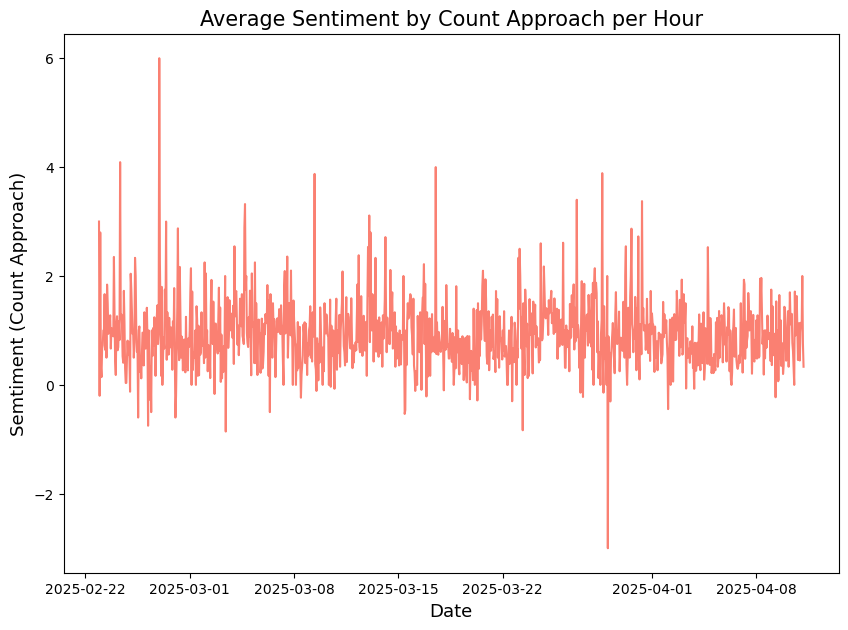

In [76]:
# Get it into a pandas data frame structure 
countSeries = pd.DataFrame(countSentiment, columns=['date', 'sentiment'])

# Tell pandas that the column is the one we use for indexing (or x-axis)
countSeries.set_index('date', inplace=True)

# we set the sentiment coulumn to floats
countSeries[['sentiment']] = countSeries[['sentiment']].apply(pd.to_numeric)

nCountSeries = countSeries.resample('1h').mean()

# Plot 
plt.figure(figsize=(10, 7))
plt.plot(nCountSeries, color='salmon')
plt.title("Average Sentiment by Count Approach per Hour",fontsize=15)
plt.ylabel("Semtiment (Count Approach)",fontsize=13)
plt.xlabel("Date", fontsize=13)
plt.show()


# Sentiment plot for Vader Approach 

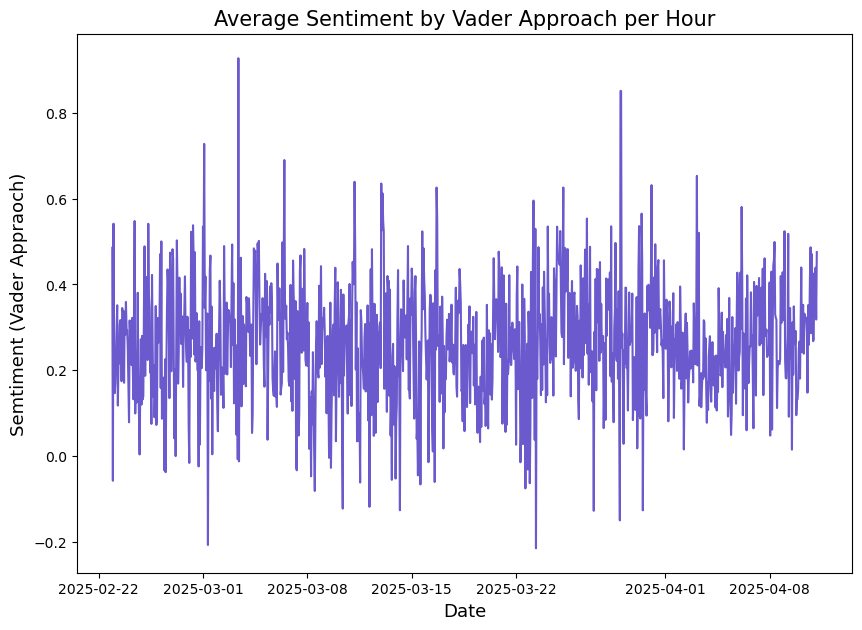

In [77]:
# Get it into a pandas data frame structure 
vaderSeries = pd.DataFrame(vaderSentiment, columns=['date', 'neg', 'neu', 'pos', 'compound'])

# Tell pandas that the column is the one we use for indexing (or x-axis)
vaderSeries.set_index('date', inplace=True)

# Set the compound coulumn to floats
vaderSeries[['compound']] = vaderSeries[['compound']].apply(pd.to_numeric)

nVaderSeries = vaderSeries.resample('1h').mean() # score ranging from -1 (negative) to +1 (positive), so apply mean()

# Plot overall compound sentiment
plt.figure(figsize=(10, 7))
plt.plot(nVaderSeries['compound'], color='slateblue') 
plt.title("Average Sentiment by Vader Approach per Hour",fontsize=15)
plt.ylabel("Semtiment (Vader Appraoch)",fontsize=13)
plt.xlabel("Date", fontsize=13)
plt.show()


In [78]:
# Total no. of overall Positive, Neutral and Negative in vaderSeries
pos_count = (vaderSeries['compound'] > 0).sum()
neu_count = (vaderSeries['compound'] == 0).sum()
neg_count = (vaderSeries['compound'] < 0).sum()

VaderCount = {
    'Positive': pos_count,
    'Neutral': neu_count,
    'Negative': neg_count
}
VaderCount

{'Positive': 13829, 'Neutral': 5960, 'Negative': 4555}

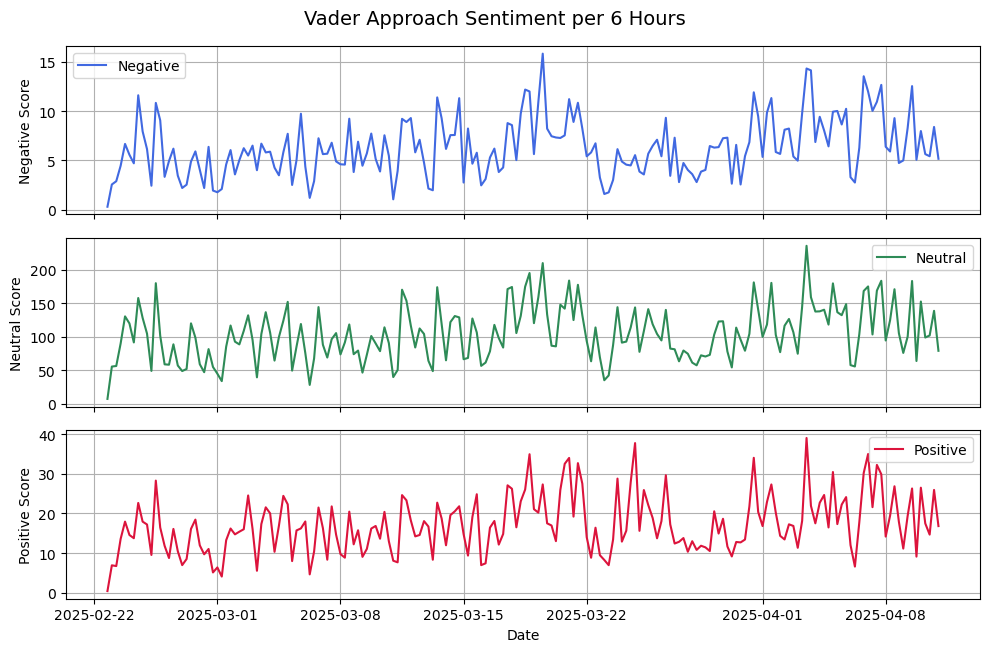

In [79]:
nVaderSeries = vaderSeries.resample('6h').sum()

# Create a figure and a set of subplots (3 rows, 1 column)
# sharex=True ensures all subplots share the same x-axis ticks and zooming
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 6), sharex=True)
fig.suptitle('Vader Approach Sentiment per 6 Hours', fontsize=14)

# Plot: Negative Score
axes[0].plot(nVaderSeries['neg'], color='royalblue', label='Negative')
axes[0].set_ylabel('Negative Score')
axes[0].legend()
axes[0].grid(True)

# Plot: Neutral Score
axes[1].plot(nVaderSeries['neu'], color='seagreen', label='Neutral')
axes[1].set_ylabel('Neutral Score')
axes[1].legend()
axes[1].grid(True)

# Plot: Positive Score
axes[2].plot(nVaderSeries['pos'], color='crimson', label='Positive')
axes[2].set_ylabel('Positive Score')
axes[2].legend()
axes[2].grid(True)
axes[2].set_xlabel('Date')

plt.tight_layout(rect=[0, -0.1, 1, 1])
plt.show()